<a href="https://colab.research.google.com/github/dosawaru/Phishing-Email-Detection/blob/main/phishing_email_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading Dataset

In [5]:
import zipfile
import os

# Link to dataset (Download zip file only)
# https://www.kaggle.com/datasets/naserabdullahalam/phishing-email-dataset/data

# Phishing Email Dataset
zip_path = 'dataset.zip'

# Extract ZIP
extract_dir = "dataset"
os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)

print("Extracted files:", os.listdir(extract_dir))
print("Dataset Loaded!")

Extracted files: ['Ling.csv', 'Nazario.csv', 'Enron.csv', 'Nigerian_Fraud.csv', 'SpamAssasin.csv', 'phishing_email.csv', 'CEAS_08.csv']
Dataset Loaded!


## Data Acquisition & Consolidation

In [6]:
import pandas as pd
import os

folder = "dataset"
# Load all CSV files in the folder besides phishing_email, redundant file
csv_files = [f for f in os.listdir(folder) if f.endswith(".csv") and f != "phishing_email.csv"]

dfs = []

print(f"CSV files: {len(csv_files)}")

for file in csv_files:
    file_path = os.path.join(folder, file)
    # encoding='latin1' is used to handle various character encodings present in the dataset.
    # on_bad_lines='skip' is used to skip malformed lines that might cause parsing errors, improving robustness.
    df = pd.read_csv(file_path, encoding="latin1", on_bad_lines="skip")
    df["source"] = file
    dfs.append(df)
    print(f"Successfully loaded '{file}' with {len(df)} rows")

# Combine all csv into a single DataFrame
data = pd.concat(dfs, ignore_index=True)
print(f"\nCombined Shape: {data.shape}")

# Create a new column called 'text_combined' (combines subject, body, sender)
data['text_combined'] = ""
columns_to_combine = ['sender', 'subject', 'body']

# Ignores NaN values and combine the specified columns into 'text_combined'.
data['text_combined'] = data[columns_to_combine].fillna('').agg(' '.join, axis=1)
data.head(3)



CSV files: 6
Successfully loaded 'Ling.csv' with 2859 rows
Successfully loaded 'Nazario.csv' with 1565 rows
Successfully loaded 'Enron.csv' with 29767 rows
Successfully loaded 'Nigerian_Fraud.csv' with 3332 rows
Successfully loaded 'SpamAssasin.csv' with 5809 rows
Successfully loaded 'CEAS_08.csv' with 39154 rows

Combined Shape: (82486, 8)


,subject,body,label,source,sender,receiver,date,urls,text_combined
0,job posting - apple-iss research center,content - length : 3386 apple-iss research cen...,0,Ling.csv,NaN,NaN,NaN,NaN,job posting - apple-iss research center conte...
1,NaN,"lang classification grimes , joseph e . and ba...",0,Ling.csv,NaN,NaN,NaN,NaN,"lang classification grimes , joseph e . and ..."
2,query : letter frequencies for text identifica...,i am posting this inquiry for sergei atamas ( ...,0,Ling.csv,NaN,NaN,NaN,NaN,query : letter frequencies for text identific...


`text_combined` was a created feature to consolidate all critical email data into a single vector space for the model. Because phishing attacks typically rely on a combination of a suspicious sender address, an urgent subject line, and a deceptive body, merging these fields allows the model to capture the full context of the email rather than evaluating isolated fragments.

### Feature Fusion





In [7]:
# Vectorized appending of URL tag
tag = " email_has_url"
mask = (data['urls'] == 1) & (~data['text_combined'].str.contains(tag))
data.loc[mask, 'text_combined'] = data['text_combined'] + tag

data[data['urls'] == 1].head(3)

,subject,body,label,source,sender,receiver,date,urls,text_combined
2859,DON'T DELETE THIS MESSAGE -- FOLDER INTERNAL DATA,This text is part of the internal format of yo...,1,Nazario.csv,Mail System Internal Data <MAILER-DAEMON@monke...,NaN,28 Sep 2017 09:57:25 -0400,1.0,Mail System Internal Data <MAILER-DAEMON@monke...
2860,Verify Your Account,Business with \t\t\t\t\t\t\t\tcPanel & WHM \t...,1,Nazario.csv,cPanel <service@cpanel.com>,jose@monkey.org,"Fri, 30 Oct 2015 00:00:48 -0500",1.0,cPanel <service@cpanel.com> Verify Your Accoun...
2861,Helpdesk Mailbox Alert!!!,Your two incoming mails were placed on pending...,1,Nazario.csv,Microsoft Outlook <recepcao@unimedceara.com.br>,NaN,"Fri, 30 Oct 2015 06:21:59 -0300 (BRT)",1.0,Microsoft Outlook <recepcao@unimedceara.com.br...


#### Why convert the 1/0 URL indicator into a text tag?
* **Creates a Strong Signal:** A unique textual tag helps the model easily identify the presence of a URL as a high-risk indicator for phishing.
* **Prevents Noise During Cleaning:** Leaving a numerical "1" in the text could cause issues later, as the cleaning process may remove all numbers and erase this important information.
* **Centralizes Features:** It allows us to seamlessly combine crucial metadata directly into the `text_combined` feature space.

## Feature Engineering

In [8]:
import re

# Flag for money symbols
data['has_money_symbol'] = data['text_combined'].str.contains(r'\$|usd', flags=re.IGNORECASE, regex=True).astype(int)

# Flag for phone numbers
data['has_phone_number'] = data['text_combined'].str.contains(r'\d{3}[-\.\s]??\d{3}[-\.\s]??\d{4}|\d{3}-\d{2}-\d{6}', regex=True).astype(int)

# Count words with 2+ uppercase letters, divide by total words
word_counts = data['text_combined'].str.split().str.len().replace(0, 1) # replace 0 with 1 to avoid ZeroDivisionError
caps_counts = data['text_combined'].str.count(r'\b[A-Z]{2,}\b')
data['caps_ratio'] = caps_counts / word_counts

data[['has_money_symbol', 'has_phone_number', 'caps_ratio']].head()

,has_money_symbol,has_phone_number,caps_ratio
0,1,0,0.0
1,1,0,0.0
2,0,0,0.0
3,0,0,0.0
4,0,0,0.0


* **Money Symbols:** Captures the financial hooks that are seen in most scams.
* **Phone Numbers:** Flags "callback scams" where attackers provide a number for the victim to call.
* **All-Caps Ratio:** Captures the urgent, aggressive formatting typical of spam.

It is crucial to extract these specific details before the cleaning phase. The text normalization process will permanently delete the capital letters and special symbols that reveal the scam


## Exploratory Data Analysis (Before Cleaning)

### Dataset Overview

In [9]:
print('Data Info')
print(f'{"-" * 50}')
data.info()

print('\nData Description')
print(f'{"-" * 50}')
display(data.describe(include='object'))
display(data.describe())

Data Info
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82486 entries, 0 to 82485
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   subject           82139 non-null  object 
 1   body              82485 non-null  object 
 2   label             82486 non-null  int64  
 3   source            82486 non-null  object 
 4   sender            49529 non-null  object 
 5   receiver          47768 non-null  object 
 6   date              49377 non-null  object 
 7   urls              49860 non-null  float64
 8   text_combined     82486 non-null  object 
 9   has_money_symbol  82486 non-null  int64  
 10  has_phone_number  82486 non-null  int64  
 11  caps_ratio        82486 non-null  float64
dtypes: float64(2), int64(3), object(7)
memory usage: 7.6+ MB

Data Description
--------------------------------------------------


,subject,body,source,sender,receiver,date,text_combined
count,82139,82485,82486,49529,47768,49377,82486
unique,49645,82483,6,31415,6510,48622,82486
top,CNN.com Daily Top 10,\n\n,CEAS_08.csv,qydlqcws-iacfym@issues.apache.org,user6@gvc.ceas-challenge.cc,"Thu, 07 Aug 2008 21:38:18 -0100",Christian Heimes <wluhe@cheimes.de> [Python-De...
freq,2930,3,39154,462,1375,8,1


,label,urls,has_money_symbol,has_phone_number,caps_ratio
count,82486.000000,49860.000000,82486.000000,82486.000000,82486.000000
mean,0.519979,0.678018,0.178600,0.064205,0.033973
std,0.499604,0.467241,0.383019,0.245119,0.105955
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,0.023810
max,1.000000,1.000000,1.000000,1.000000,7.124324


In [10]:
# Check for duplicate rows and drop them
duplicates = data.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

if duplicates > 0:
    data.drop_duplicates(inplace=True)
    print(f"Number of rows after dropping duplicates: {len(data)}")

Number of duplicate rows: 0


### Variable Distribution

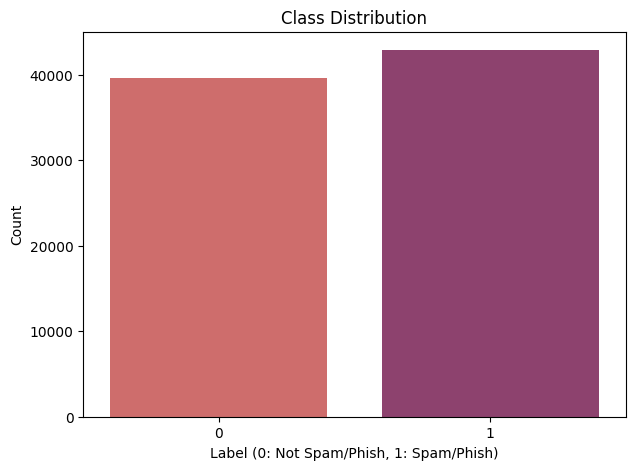

,count
label,
1,42891
0,39595


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot distribution (Not Spam/Phish vs. Spam/Phish)
plt.figure(figsize=(7,5))
sns.countplot(data=data, x="label", hue="label", palette="flare", legend=False)
plt.title("Class Distribution")
plt.xlabel("Label (0: Not Spam/Phish, 1: Spam/Phish)")
plt.ylabel("Count")
plt.show()

display(data["label"].value_counts())

### Text Length Analysis

Number of empty rows: 0


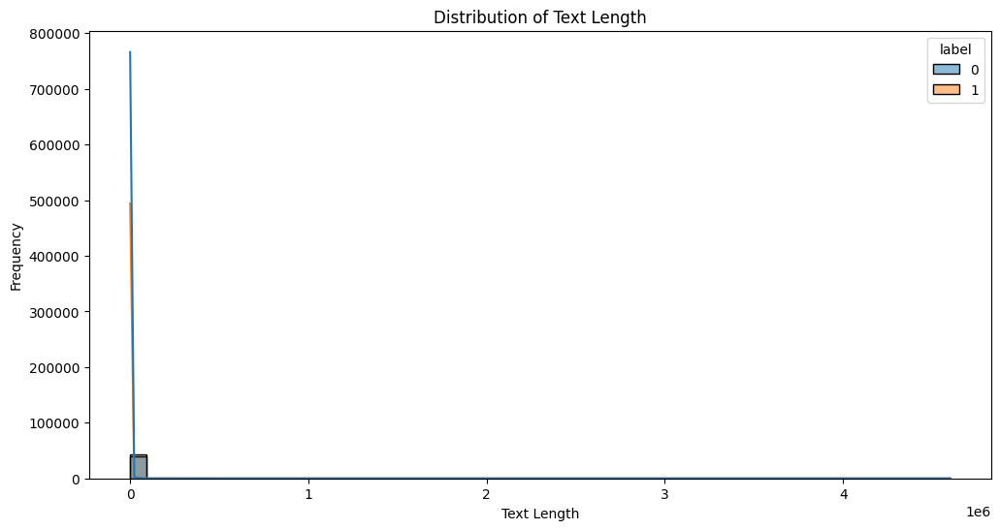

Average text length based on label:


,text_length
label,
0,2228.12
1,1461.09


In [12]:
data['text_length'] = data['text_combined'].str.len().fillna(0).astype(int)

# Handle missing values
empty_count = (data['text_length'] == 0).sum()
print(f"Number of empty rows: {empty_count}")

# Plot text length
plt.figure(figsize=(12, 6))
sns.histplot(data=data, x='text_length', hue='label', kde=True, bins=50)
plt.title('Distribution of Text Length')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.show()

print("Average text length based on label:")
display(data.groupby('label')['text_length'].mean().round(2))

The plot shows an extreme positive skew, where a few massive outliers (reaching over 4 million characters) have squashed the rest of the data near zero. This visual confirms the presence of anomalous "junk" data (such as system logs or error dumps) that must be filtered out to ensure model stability


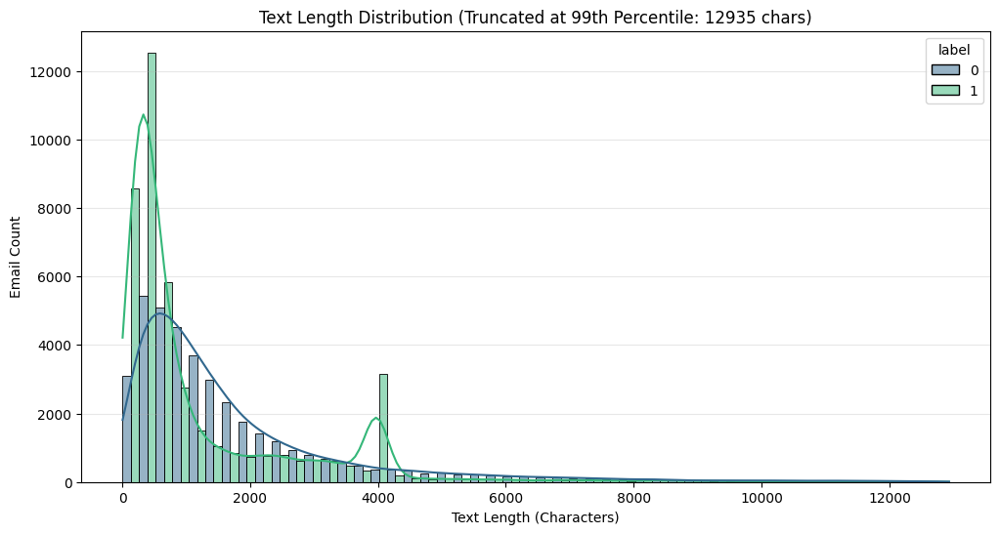

In [13]:
# Filter extreme outliers
limit = data['text_length'].quantile(0.99)
filtered_data = data[data['text_length'] <= limit].copy()

# Plot
plt.figure(figsize=(12, 6))
sns.histplot(data=filtered_data, x='text_length', hue='label', kde=True,
             bins=50, multiple="dodge", palette="viridis")
plt.title(f'Text Length Distribution (Truncated at 99th Percentile: {int(limit)} chars)')
plt.xlabel('Text Length (Characters)')
plt.ylabel('Email Count')
plt.grid(axis='y', alpha=0.3)
plt.show()

Word Frequency Analysis

Top 20 Most Frequent Words:
[('the', 641945), ('.', 578953), ('-', 499153), ('to', 476399), (',', 419439), ('of', 367929), ('and', 360003), ('>', 322874), ('a', 285481), ('in', 255218), (':', 191195), ('for', 190799), ('/', 181979), ('is', 177758), ('you', 167595), ('that', 135565), ('this', 135287), ('_', 132409), ('on', 123719), ('your', 120080)]


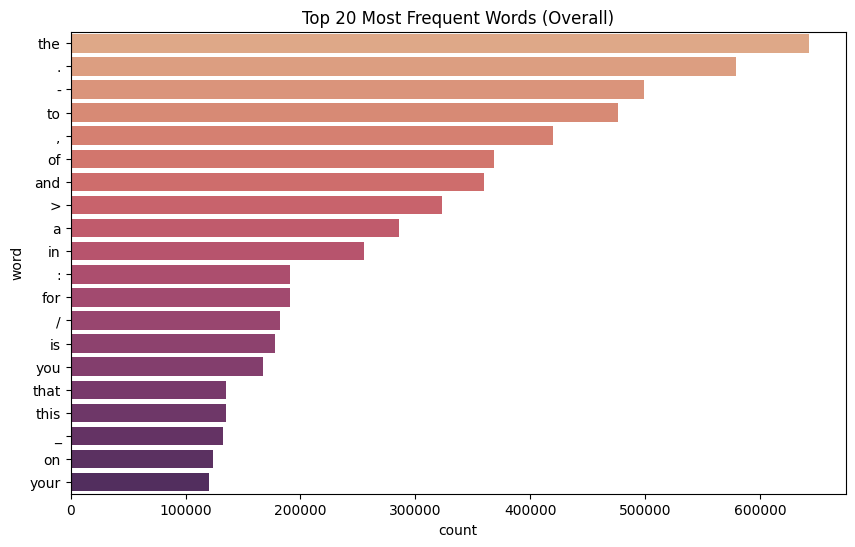

In [14]:
from collections import Counter

# Most frequent words overall
words = " ".join(data["text_combined"].fillna("")).split()

# Get Top 20 and plot
word_freq = Counter(words).most_common(20)
print("Top 20 Most Frequent Words:")
print(word_freq)
df_freq = pd.DataFrame(word_freq, columns=["word", "count"])

plt.figure(figsize=(10, 6))
sns.barplot(x="count", y="word", data=df_freq, palette="flare", hue="word", legend=False)
plt.title("Top 20 Most Frequent Words (Overall)")
plt.show()


The chart shows that your dataset is dominated by "noise" like symbols, dates, ID number, etc. This shows that the raw text contains a lot of uncleaned email headers and metadata.




## Data Cleaning

In [15]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)

stop_words = set(stopwords.words('english'))

# Add common internet terms to the stop_words set and dataset noise
internet_stopwords = [
    'com', 'http', 'www', 'html', 'email', 'video', 'index', 'submission',
    'enron', 'org', 'mail', 'cnn', 'hpl', 'nom','file', 'attachment', 'attached',
    'python', 'ect', 'url', 'message', 'would', 'get', 'information', 'top',
    'note', 'net', 'name'
]

dataset_noise = [
    'please', 'one', 'company', 'new', 'time', 'list', 'partner',
    'may', 'news', 'need', 'use', 'like', 'also', 'business', 'make',
    'account', 'subject', 'added', 'email_has_url',
    'work', 'sender', 'know', 'year', 'system', 'total', 'day',
    'service', 'price', 'want', 'university', 'address', 'hou', 'right',
    'see', 'help', 'wrote', 'send', 'could', 'take', 'people', 'daily',
    'thanks', 'result', 'group', 'way', 'paper', 'said',
    'change', 'first'
]

# Update stop word
stop_words.update(internet_stopwords)
stop_words.update(dataset_noise)

print(f"Updated stop_words set contains {len(stop_words)} words.")

lemmatizer = WordNetLemmatizer()

Updated stop_words set contains 275 words.


Added custom stop-word list to filter out common internet jargon, HTML fragments, and database noise

### Keeping only letters/underscores and ignore filler words

In [16]:
# Convert to string and lowercase
data['clean_text'] = data['text_combined'].astype(str).str.lower()

# Remove URLs and Email addresses
data['clean_text'] = data['clean_text'].str.replace(r'http\S+|www\.\S+', ' ', regex=True)
data['clean_text'] = data['clean_text'].str.replace(r'\S+@\S+', ' ', regex=True)

# Remove HTML tags
data['clean_text'] = data['clean_text'].str.replace(r'<.*?>', ' ', regex=True)

# Remove the custom tag explicitly (just in case it survives as a substring)
data['clean_text'] = data['clean_text'].str.replace('email_has_url', ' ', regex=False)

# Remove non-alphabetical characters
data['clean_text'] = data['clean_text'].str.replace(r'[^a-z\s]', ' ', regex=True)

# Apply Stopwords, Lemmatization, and filter out single-character words
data['clean_text'] = data['clean_text'].apply(
    lambda text: " ".join([
        lemmatized_word for w in text.split()
        for lemmatized_word in [lemmatizer.lemmatize(w)]
        if lemmatized_word not in stop_words and len(lemmatized_word) > 2
    ])
)

 ## Exploratory Data Analysis (After Cleaning)

Top 20 Most Frequent Words:
[('money', 20138), ('virus', 18214), ('free', 16636), ('number', 16071), ('report', 15945), ('network', 15855), ('security', 15317), ('user', 15264), ('alert', 15256), ('contact', 14700), ('click', 14593), ('problem', 14492), ('data', 14373), ('call', 14360), ('deal', 13964), ('order', 13559), ('bank', 13486), ('million', 13420), ('line', 13329), ('site', 13295)]


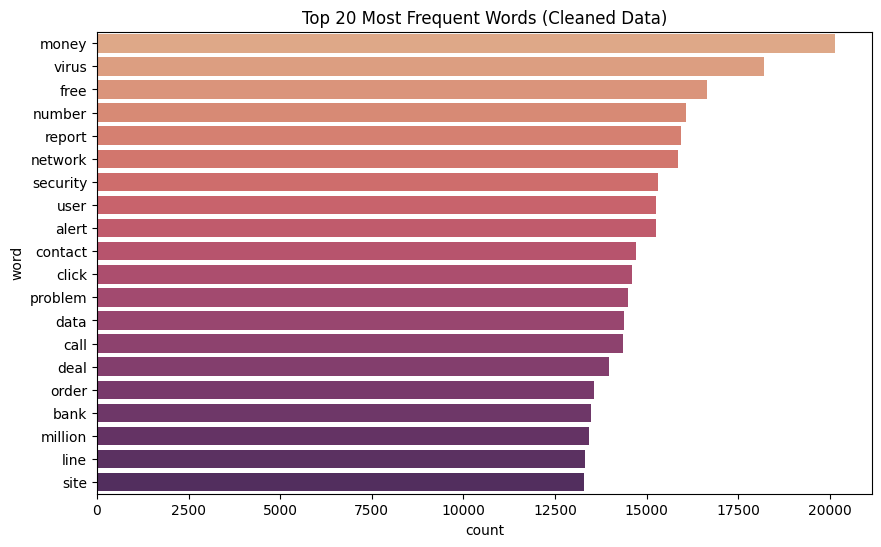

In [17]:
# Most frequent words overall
words = " ".join(data["clean_text"].fillna("")).split()

# Get Top 20 from the clean text
word_freq = Counter(words).most_common(20)
print("Top 20 Most Frequent Words:")
print(word_freq)
df_freq = pd.DataFrame(word_freq, columns=["word", "count"])

plt.figure(figsize=(10,6))
sns.barplot(x="count", y="word", data=df_freq, palette="flare", hue="word", legend=False)
plt.title("Top 20 Most Frequent Words (Cleaned Data)")
plt.show()


Took multiple iterations to remove all noise and get a well defined list of  Most Frequent Words

### Word Cloud


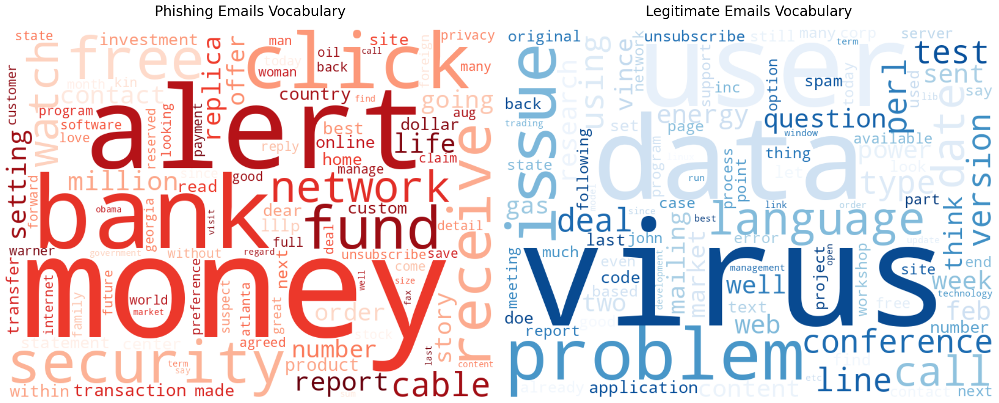

In [18]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

def get_word_frequencies(text_series, max_words=100):
    word_counts = Counter()
    for text in text_series.dropna():
        word_counts.update(str(text).split())
    return dict(word_counts.most_common(max_words))

# Get frequencies for Phishing (label=1) and Legitimate (label=0)
# Replace '1' and '0' with your actual label values if they are different
phishing_freq = get_word_frequencies(data[data['label'] == 1]['clean_text'])
legit_freq = get_word_frequencies(data[data['label'] == 0]['clean_text'])

# Define a consistent WordCloud style
wc_style = {
    'width': 800,
    'height': 600,
    'background_color': 'white',
    'max_words': 100,
    'relative_scaling': 0.8
}

# Generate both clouds
wc_phishing = WordCloud(colormap='Reds', **wc_style).generate_from_frequencies(phishing_freq)
wc_legit = WordCloud(colormap='Blues', **wc_style).generate_from_frequencies(legit_freq)

# Plot them side-by-side
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Phishing Cloud
axes[0].imshow(wc_phishing, interpolation='bilinear')
axes[0].set_title("Phishing Emails Vocabulary", fontsize=20, pad=20)
axes[0].axis("off")

# Legitimate Cloud
axes[1].imshow(wc_legit, interpolation='bilinear')
axes[1].set_title("Legitimate Emails Vocabulary", fontsize=20, pad=20)
axes[1].axis("off")

plt.tight_layout()
plt.show()

The word clouds below visualize the top 100 most frequent words for both phishing and legitimate emails. Word size is directly proportional to frequency, allowing for an intuitive visual comparison of the distinct vocabularies between the two classes


## Feature Engineering: TD-IDF Vectorization

In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize vectorizer to weight words by importance
tfidf = TfidfVectorizer(max_features=5000, ngram_range=(1,2))

# Convert text to numbers and set target labels
X = tfidf.fit_transform(data['clean_text'].fillna(""))
y = data['label']

print(f"Feature Matrix Shape: {X.shape}")

Feature Matrix Shape: (82486, 5000)


* **TF-IDF Vectorization:** We convert the cleaned text into a numerical format using a Term Frequency-Inverse Document Frequency (TF-IDF) matrix.
* **Feature Limit:** By limiting the features to the top 5,000 most important single words (unigrams) and two-word phrases (bigrams), we capture essential contextual signals while preventing the model from becoming overly complex and consuming excessive memory.

## Clustering (Unsupervised): K-Means

### Choosing the Optimal Number of Clusters (k)

k=2 | Inertia: 79319.94
k=3 | Inertia: 77908.73
k=4 | Inertia: 77253.35
k=5 | Inertia: 76706.23
k=6 | Inertia: 75629.40
k=7 | Inertia: 75499.69
k=8 | Inertia: 74382.92
k=9 | Inertia: 74108.77
k=10 | Inertia: 73275.04


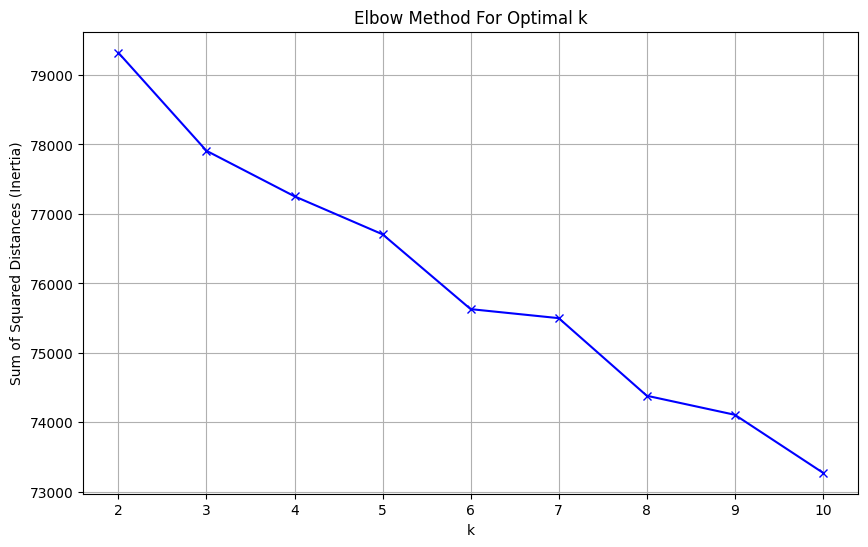

In [20]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Elbow Method
sum_of_squared_distances = []
K = range(2, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    sum_of_squared_distances.append(kmeans.inertia_)
    print(f"k={k} | Inertia: {kmeans.inertia_:.2f}")

plt.figure(figsize=(10, 6))
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

By fitting K-Means for various values of `k` and plotting the inertia, we can identify the "elbow" the point of diminishing returns. The graph indicates the optimal number of clusters is **k=3**, where inertia reduction stabilizes. Proceeding past this point risks overfitting the clusters.

### Applying K-Means Clustering

In [21]:
# Apply K-Means with the chosen k
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X)

print(f"K-Means clustering applied with {optimal_k} clusters.")
print("First 10 cluster labels:", cluster_labels[:10])
print("Cluster distribution:\n", pd.Series(cluster_labels).value_counts().sort_index())

K-Means clustering applied with 3 clusters.
First 10 cluster labels: [1 1 1 1 1 1 1 1 1 1]
Cluster distribution:
 0     2315
1    75826
2     4345
Name: count, dtype: int64


### Integrating Cluster Labels into Feature Set

In [22]:
import scipy.sparse

# Convert cluster_labels to a sparse matrix (column vector)
cluster_labels_sparse = scipy.sparse.csr_matrix(cluster_labels).T

# Concatenate the original TF-IDF features (X) with the new cluster labels
X_augmented = scipy.sparse.hstack((X, cluster_labels_sparse))

print(f"Original Feature Matrix Shape: {X.shape}")
print(f"Augmented Feature Matrix Shape: {X_augmented.shape}")

Original Feature Matrix Shape: (82486, 5000)
Augmented Feature Matrix Shape: (82486, 5001)


## Model Selection & Training


### Finding Best Model

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluation_baseline_models(X_train, y_train, X_test, y_test):

  # Testing multiple model
  models = {
    "Naive Bayes": MultinomialNB(),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Linear SVM": LinearSVC(dual=False, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
  }

  results = []

  for name, model in models.items():
    # Train selected model
    model.fit(X_train, y_train)

    # Prediction on test set
    y_pred = model.predict(X_test)

    # Calculate metrics
    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred)
    })

  # Sort by F1-Score to get the best model
  results_df = pd.DataFrame(results).sort_values(by="F1 Score", ascending=False)
  return results_df

X_train, X_test, y_train, y_test = train_test_split(X_augmented, y, test_size=0.2, random_state=42)

print("Baseline Model Evaluation:")
baseline_model_results = evaluation_baseline_models(X_train, y_train, X_test, y_test)

display(baseline_model_results)

Baseline Model Evaluation:


,Model,Accuracy,Precision,Recall,F1 Score
2,Linear SVM,0.976664,0.973966,0.981150,0.977544
1,Logistic Regression,0.976058,0.974487,0.979394,0.976934
3,Random Forest,0.974845,0.982084,0.969090,0.975544
0,Naive Bayes,0.944478,0.979258,0.912071,0.944471


The F1-score is the industry standard metric for evaluating phishing detection models because it balances the tradeoff between Precision (minimizing false positives, like sending an important email to spam) and Recall (minimizing false negatives, like letting a phishing email into the inbox).

**Conclusion:** Based on the baseline evaluation, the **Linear SVM** provides the highest F1-score and will be selected for hyperparameter tuning.

### Hyperparameter Tuning

In [24]:
from sklearn.model_selection import GridSearchCV

# Define grid parameters
param_grid = {
    'C': [0.01, 0.1, 1, 10 , 100],
    'loss': ['hinge', 'squared_hinge'],
    'class_weight': [None, 'balanced']
}

# Grid Search with 5 fold cross validation
grid_search = GridSearchCV(
    estimator = LinearSVC(dual=False, random_state=42, max_iter=2000),
    param_grid = param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
best_svm_model = grid_search.best_estimator_

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
50 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/svm/_classes.py", line 321, in fit
    self.coef_, self.intercept_, n_i

Best Parameters: {'C': 1, 'class_weight': 'balanced', 'loss': 'squared_hinge'}


Using `GridSearchCV` with 5-fold cross-validation to systematically explore the optimal configuration for our Linear SVM.
* **Parameters Tested:** Various regularization strengths (`C`), loss functions, and `class_weight` strategies.
* **Objective:** The search was configured to maximize the **F1-score**, ensuring the model maintains a strict balance between Precision and Recall.

## Performance Evaluation


### Evaluation of Model


In [25]:
y_pred = best_svm_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      7957
           1       0.97      0.98      0.98      8541

    accuracy                           0.98     16498
   macro avg       0.98      0.98      0.98     16498
weighted avg       0.98      0.98      0.98     16498



#### Optimal Model Configuration
The Grid Search identified the following hyperparameters as the most effective for this dataset:
* **C (Regularization):** `1`
* **Class Weight:** `balanced`
* **Loss Function:** `squared_hinge`

### Confusion Matrix

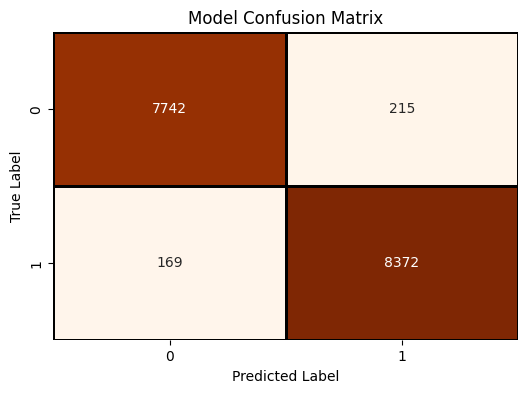

In [26]:
con_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(con_matrix, annot=True, fmt='d', cmap='Oranges', cbar=False, linecolor='black', linewidths=1)
plt.title('Model Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Top 15 Safe vs. Phishing Words (SVM Coefficients)

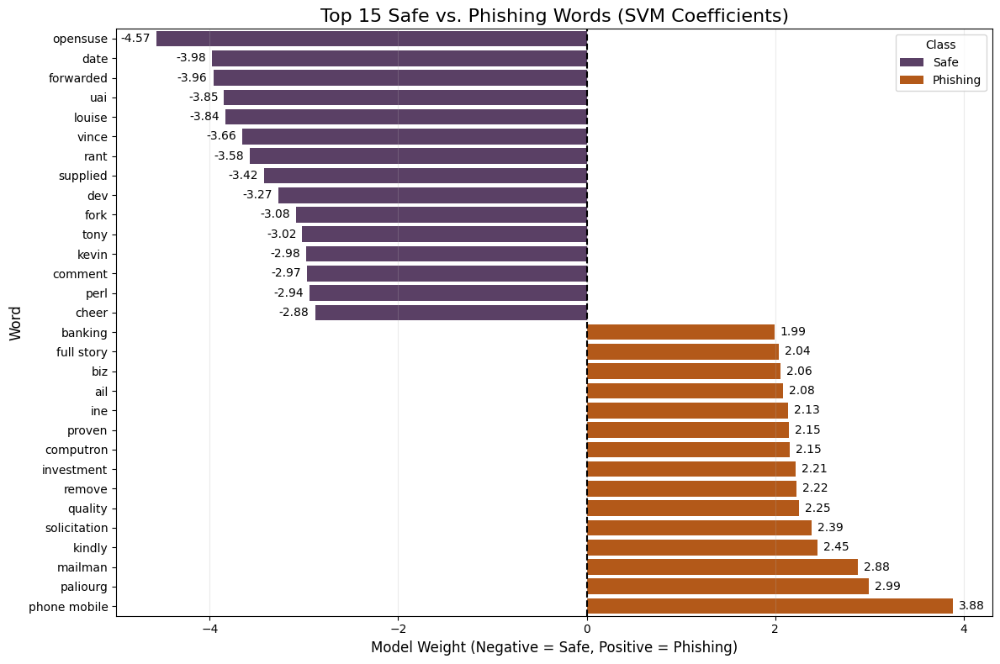

In [27]:
import numpy as np

# Feature names (words) and the model coefficients (weights)
feature_names = tfidf.get_feature_names_out().tolist() # Convert to list to append
# Add a name for the cluster feature
feature_names.append('cluster_label')

coefficients = best_svm_model.coef_[0]

# Match words to weights and sort
feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': coefficients})
feature_importance = feature_importance.sort_values(by='Importance', ascending=True)

# Extract the Top 15 Safe/Phishing words
top_safe = feature_importance.head(15)
top_phishing = feature_importance.tail(15)
combined_importance = pd.concat([top_safe, top_phishing])

# Legend
combined_importance['Class'] = np.where(combined_importance['Importance'] > 0, 'Phishing', 'Safe')

plt.figure(figsize=(12, 8))
ax = plt.gca()

sns.barplot(
    x='Importance',
    y='Feature',
    data=combined_importance,
    palette={'Safe': '#5c3a6b', 'Phishing': '#cc5500'},
    hue='Class',
    ax=ax
)

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=5, fontsize=10)

plt.title('Top 15 Safe vs. Phishing Words (SVM Coefficients)', fontsize=16)
plt.xlabel('Model Weight (Negative = Safe, Positive = Phishing)', fontsize=12)
plt.ylabel('Word', fontsize=12)
plt.axvline(x=0, color='black', linestyle='--')
plt.tight_layout()
plt.grid(axis='x', alpha=0.25)
plt.show()

### ROC Curve

<Figure size 800x600 with 0 Axes>

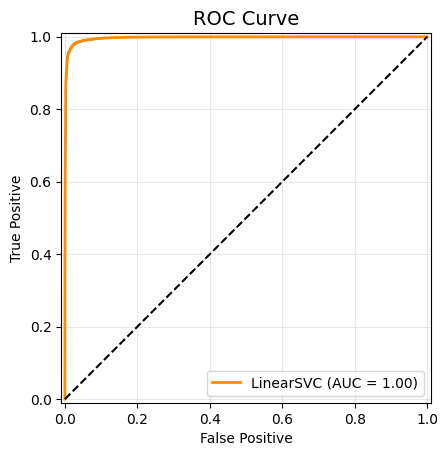

In [28]:
from sklearn.metrics import RocCurveDisplay

plt.figure(figsize=(8, 6))
RocCurveDisplay.from_estimator(best_svm_model, X_test, y_test, color='darkorange', linewidth=2)
plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.title('ROC Curve', fontsize=14)
plt.xlabel('False Positive')
plt.ylabel('True Positive')
plt.grid(alpha=0.3)
plt.show()

#### Final Model Performance
The optimized Linear SVM demonstrated exceptional performance on the unseen test set:
* **Overall Accuracy:** Achieved **98%**, successfully separating the vast majority of phishing and legitimate emails.
* **Precision & Recall:** Both metrics scored **98%**, indicating a highly reliable model. It exhibits extremely low false positive rates (safe emails misclassified as phishing) and low false negative rates (phishing emails bypassing the filter).
* **Error Rate:** Out of approximately 16,500 tested emails, only 169 were misclassified, proving the robustness of the TF-IDF and SVM pipeline.

### Conclusion & Feature Explainability
By extracting the coefficients from the Linear SVM, we can interpret exactly *how* the model makes its decisions:
* **Phishing Indicators (Positive Weights):** Words with the highest positive coefficients are strong signals of malicious intent (e.g., urgency, account verification).
* **Safe Indicators (Negative Weights):** Words with the lowest negative coefficients represent vocabulary typically found in benign, legitimate correspondence.

**Business Impact:** This transparency is crucial for deploying machine learning in cybersecurity. It allows security analysts to verify that the model is learning logical, human-readable rules rather than relying on an a "black box."